In [ ]:
!pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# Import Library

In [129]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium
import geopandas as gpd
from wordcloud import WordCloud
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler
from sklearn import linear_model
from sklearn.metrics import r2_score 
from sklearn.metrics import mean_absolute_error,mean_absolute_percentage_error,mean_squared_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

# Data Check

In [ ]:
df = pd.read_csv('/content/Airbnb_Open_Data.csv', sep=',', encoding='utf-8')

<ipython-input-3-a3864c6113d2>:1: DtypeWarning: Columns (25) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/content/Airbnb_Open_Data.csv', sep=',', encoding='utf-8')


In [ ]:
# Backup data
hotelData = df.copy()
hotelData

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,...,$193,10.0,9.0,10/19/2021,0.21,4.0,6.0,286.0,Clean up and treat the home the way you'd like...,NaN
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,...,$28,30.0,45.0,5/21/2022,0.38,4.0,2.0,228.0,Pet friendly but please confirm with me if the...,NaN
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,NaN,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,$124,3.0,0.0,NaN,NaN,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and...",NaN
3,1002755,NaN,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.68514,-73.95976,United States,...,$74,30.0,270.0,7/5/2019,4.64,4.0,1.0,322.0,NaN,NaN
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,United States,...,$41,10.0,9.0,11/19/2018,0.10,3.0,1.0,289.0,"Please no smoking in the house, porch or on th...",NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102594,6092437,Spare room in Williamsburg,12312296767,verified,Krik,Brooklyn,Williamsburg,40.70862,-73.94651,United States,...,$169,1.0,0.0,NaN,NaN,3.0,1.0,227.0,No Smoking No Parties or Events of any kind Pl...,NaN
102595,6092990,Best Location near Columbia U,77864383453,unconfirmed,Mifan,Manhattan,Morningside Heights,40.80460,-73.96545,United States,...,$167,1.0,1.0,7/6/2015,0.02,2.0,2.0,395.0,House rules: Guests agree to the following ter...,NaN
102596,6093542,"Comfy, bright room in Brooklyn",69050334417,unconfirmed,Megan,Brooklyn,Park Slope,40.67505,-73.98045,United States,...,$198,3.0,0.0,NaN,NaN,5.0,1.0,342.0,NaN,NaN
102597,6094094,Big Studio-One Stop from Midtown,11160591270,unconfirmed,Christopher,Queens,Long Island City,40.74989,-73.93777,United States,...,$109,2.0,5.0,10/11/2015,0.10,3.0,1.0,386.0,NaN,NaN


In [ ]:
# Column check
hotelData.columns

Index(['id', 'NAME', 'host id', 'host_identity_verified', 'host name',
       'neighbourhood group', 'neighbourhood', 'lat', 'long', 'country',
       'country code', 'instant_bookable', 'cancellation_policy', 'room type',
       'Construction year', 'price', 'service fee', 'minimum nights',
       'number of reviews', 'last review', 'reviews per month',
       'review rate number', 'calculated host listings count',
       'availability 365', 'house_rules', 'license'],
      dtype='object')

In [ ]:
hotelData.isnull().sum()

id                                     0
NAME                                 250
host id                                0
host_identity_verified               289
host name                            406
neighbourhood group                   29
neighbourhood                         16
lat                                    8
long                                   8
country                              532
country code                         131
instant_bookable                     105
cancellation_policy                   76
room type                              0
Construction year                    214
price                                247
service fee                          273
minimum nights                       409
number of reviews                    183
last review                        15893
reviews per month                  15879
review rate number                   326
calculated host listings count       319
availability 365                     448
house_rules     

In [ ]:
hotelData.duplicated().sum()

541

In [ ]:
# Mengecek unique value yang terdapat pada setiap kolom
for col in df.columns:
    print(col)
    print(df[col].unique())

id
[ 1001254  1002102  1002403 ... 57366313 57366865 57367417]
NAME
['Clean & quiet apt home by the park' 'Skylit Midtown Castle'
 'THE VILLAGE OF HARLEM....NEW YORK !' ...
 'Elmhurst 1st Fl Rightl Bedroom'
 'Elmhurst 1st Floor BR w/ Pvt. Bath&Balcony'
 'Parisian Style Apartment in Heart of Brooklyn']
host id
[80014485718 52335172823 78829239556 ... 23801060917 15593031571
 93578954226]
host_identity_verified
['unconfirmed' 'verified' nan]
host name
['Madaline' 'Jenna' 'Elise' ... 'Anna B' 'Natalie And Dan' 'Apostle John']
neighbourhood group
['Brooklyn' 'Manhattan' 'brookln' 'manhatan' 'Queens' nan 'Staten Island'
 'Bronx']
neighbourhood
['Kensington' 'Midtown' 'Harlem' 'Clinton Hill' 'East Harlem'
 'Murray Hill' 'Bedford-Stuyvesant' "Hell's Kitchen" 'Upper West Side'
 'Chinatown' 'South Slope' 'West Village' 'Williamsburg' 'Fort Greene'
 'Chelsea' 'Crown Heights' 'Park Slope' 'Windsor Terrace' 'Inwood'
 'East Village' 'Greenpoint' 'Bushwick' 'Flatbush' 'Lower East Side'
 'Prospect-Le

In [ ]:
hotelData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102599 entries, 0 to 102598
Data columns (total 26 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   id                              102599 non-null  int64  
 1   NAME                            102349 non-null  object 
 2   host id                         102599 non-null  int64  
 3   host_identity_verified          102310 non-null  object 
 4   host name                       102193 non-null  object 
 5   neighbourhood group             102570 non-null  object 
 6   neighbourhood                   102583 non-null  object 
 7   lat                             102591 non-null  float64
 8   long                            102591 non-null  float64
 9   country                         102067 non-null  object 
 10  country code                    102468 non-null  object 
 11  instant_bookable                102494 non-null  object 
 12  cancellation_pol

In [ ]:
hotelData.describe()

,id,host id,lat,long,Construction year,minimum nights,number of reviews,reviews per month,review rate number,calculated host listings count,availability 365
count,1.025990e+05,1.025990e+05,102591.000000,102591.000000,102385.000000,102190.000000,102416.000000,86720.000000,102273.000000,102280.000000,102151.000000
mean,2.914623e+07,4.925411e+10,40.728094,-73.949644,2012.487464,8.135845,27.483743,1.374022,3.279106,7.936605,141.133254
std,1.625751e+07,2.853900e+10,0.055857,0.049521,5.765556,30.553781,49.508954,1.746621,1.284657,32.218780,135.435024
min,1.001254e+06,1.236005e+08,40.499790,-74.249840,2003.000000,-1223.000000,0.000000,0.010000,1.000000,1.000000,-10.000000
25%,1.508581e+07,2.458333e+10,40.688740,-73.982580,2007.000000,2.000000,1.000000,0.220000,2.000000,1.000000,3.000000
50%,2.913660e+07,4.911774e+10,40.722290,-73.954440,2012.000000,3.000000,7.000000,0.740000,3.000000,1.000000,96.000000
75%,4.320120e+07,7.399650e+10,40.762760,-73.932350,2017.000000,5.000000,30.000000,2.000000,4.000000,2.000000,269.000000
max,5.736742e+07,9.876313e+10,40.916970,-73.705220,2022.000000,5645.000000,1024.000000,90.000000,5.000000,332.000000,3677.000000


In [ ]:
hotelData.describe(include='all').style.background_gradient(cmap='OrRd')

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,country code,instant_bookable,cancellation_policy,room type,Construction year,price,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
count,102599.000000,102349,102599.000000,102310,102193,102570,102583,102591.000000,102591.000000,102067,102468,102494,102523,102599,102385.000000,102352,102326,102190.000000,102416.000000,86706,86720.000000,102273.000000,102280.000000,102151.000000,50468,2
unique,nan,61281,nan,2,13190,7,224,nan,nan,1,1,2,3,4,nan,1151,231,nan,nan,2477,nan,nan,nan,nan,1976,1
top,nan,Home away from home,nan,unconfirmed,Michael,Manhattan,Bedford-Stuyvesant,nan,nan,United States,US,False,moderate,Entire home/apt,nan,$206,$41,nan,nan,6/23/2019,nan,nan,nan,nan,#NAME?,41662/AL
freq,nan,33,nan,51200,881,43792,7937,nan,nan,102067,102468,51474,34343,53701,nan,137,526,nan,nan,2443,nan,nan,nan,nan,2712,2
mean,29146234.522130,nan,49254111474.328667,nan,nan,nan,nan,40.728094,-73.949644,nan,nan,nan,nan,nan,2012.487464,nan,nan,8.135845,27.483743,nan,1.374022,3.279106,7.936605,141.133254,nan,nan
std,16257505.607309,nan,28538996644.374878,nan,nan,nan,nan,0.055857,0.049521,nan,nan,nan,nan,nan,5.765556,nan,nan,30.553781,49.508954,nan,1.746621,1.284657,32.218780,135.435024,nan,nan
min,1001254.000000,nan,123600518.000000,nan,nan,nan,nan,40.499790,-74.249840,nan,nan,nan,nan,nan,2003.000000,nan,nan,-1223.000000,0.000000,nan,0.010000,1.000000,1.000000,-10.000000,nan,nan
25%,15085814.500000,nan,24583328475.000000,nan,nan,nan,nan,40.688740,-73.982580,nan,nan,nan,nan,nan,2007.000000,nan,nan,2.000000,1.000000,nan,0.220000,2.000000,1.000000,3.000000,nan,nan
50%,29136603.000000,nan,49117739352.000000,nan,nan,nan,nan,40.722290,-73.954440,nan,nan,nan,nan,nan,2012.000000,nan,nan,3.000000,7.000000,nan,0.740000,3.000000,1.000000,96.000000,nan,nan
75%,43201198.000000,nan,73996495817.000000,nan,nan,nan,nan,40.762760,-73.932350,nan,nan,nan,nan,nan,2017.000000,nan,nan,5.000000,30.000000,nan,2.000000,4.000000,2.000000,269.000000,nan,nan


<ipython-input-12-682b3bda1a39>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(hotelData.corr(), center=0, cmap='OrRd', annot=True, square=True)


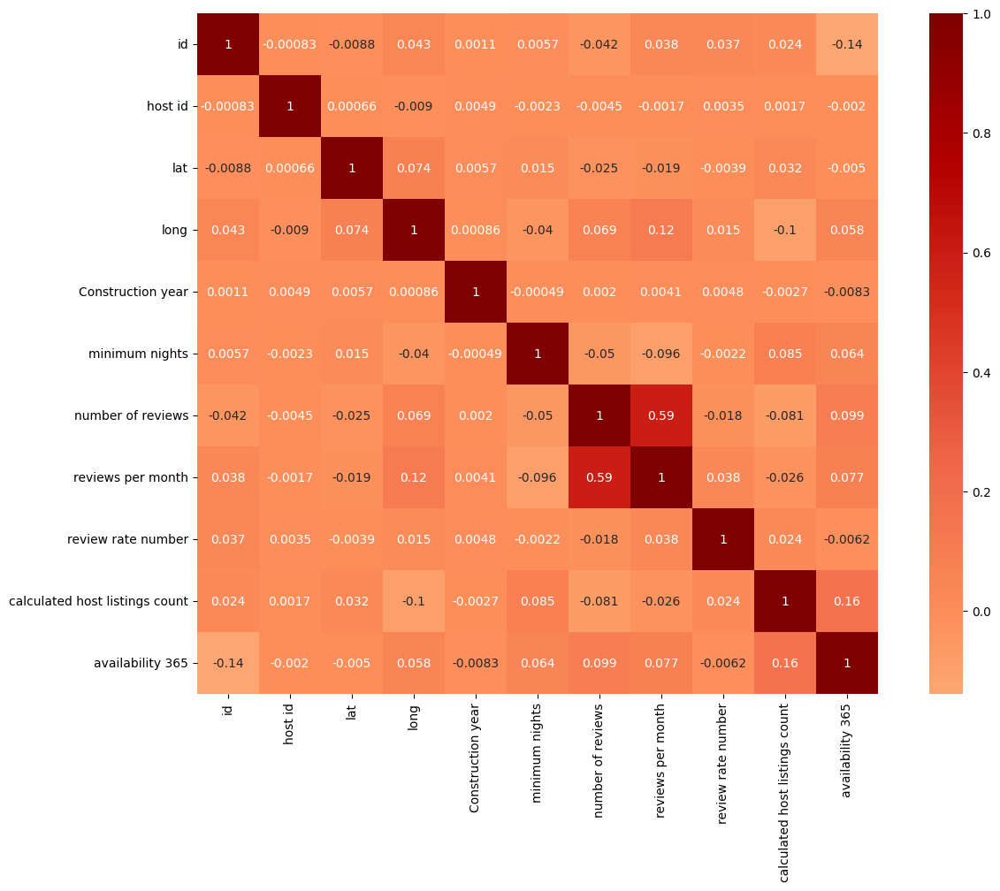

In [ ]:
plt.figure(figsize=(15,10))
sns.heatmap(hotelData.corr(), center=0, cmap='OrRd', annot=True, square=True)
plt.show()

# Data Preprocessing

## Menghapus duplikat data

In [ ]:
# Mengatasi duplicate data dengan menghapus data yang terduplikat
hotelData.drop_duplicates(inplace=True)

In [ ]:
hotelData.shape

(102058, 26)

## Menghapus kolom

In [ ]:
print('Total kolom sebelum dihapus : ', len(hotelData.columns), '\n')
print('Kolom dengan missing values lebih dari 50% : ')
print(hotelData.columns[hotelData.isnull().mean() > 0.5], '\n')
hotelData = hotelData.drop(hotelData.columns[hotelData.isnull().mean() > 0.5], axis=1)
print('Total kolom setelah dihapus : ', len(hotelData.columns))

Total kolom sebelum dihapus :  26 

Kolom dengan missing values lebih dari 50% : 
Index(['house_rules', 'license'], dtype='object') 

Total kolom setelah dihapus :  24


## Mengubah nilai

In [ ]:
hotelData['last review'] = pd.to_datetime(hotelData['last review'])

In [ ]:
hotelData['price'] = hotelData['price'].str.replace(r'\$', '', regex=True)
hotelData['price'] = hotelData['price'].str.replace(',', '').astype(float)

In [ ]:
hotelData['price']

0          966.0
1          142.0
2          620.0
3          368.0
4          204.0
           ...  
102053     696.0
102054     909.0
102055     387.0
102056     848.0
102057    1128.0
Name: price, Length: 102058, dtype: float64

In [ ]:
hotelData['service fee']

0         $193 
1          $28 
2         $124 
3          $74 
4          $41 
          ...  
102053      NaN
102054      NaN
102055      NaN
102056      NaN
102057      NaN
Name: service fee, Length: 102058, dtype: object

In [ ]:
hotelData['service fee'] = hotelData['service fee'].str.replace(r'\$', '', regex=True)
hotelData['service fee'] = hotelData['service fee'].str.replace(',', '').astype(float)

In [ ]:
hotelData['service fee']

0         193.0
1          28.0
2         124.0
3          74.0
4          41.0
          ...  
102053      NaN
102054      NaN
102055      NaN
102056      NaN
102057      NaN
Name: service fee, Length: 102058, dtype: float64

## Menghapus null value

In [ ]:
hotelData.isnull().sum()

id                                    0
NAME                                250
host id                               0
host_identity_verified              289
host name                           404
neighbourhood group                  29
neighbourhood                        16
lat                                   8
long                                  8
country                             532
country code                        131
instant_bookable                    105
cancellation_policy                  76
room type                             0
Construction year                   214
price                               247
service fee                         273
minimum nights                      400
number of reviews                   183
last review                       15832
reviews per month                 15818
review rate number                  319
calculated host listings count      319
availability 365                    448
dtype: int64

In [ ]:
hotelData.shape

(102058, 24)

In [ ]:
hotelData = hotelData.dropna(subset=['price', 'NAME', 'host_identity_verified'])
hotelData = hotelData.dropna(subset=['neighbourhood group', 'neighbourhood'])
hotelData = hotelData.dropna(subset=['cancellation_policy'])
hotelData = hotelData.dropna(subset=['instant_bookable', 'host name', 'Construction year'])
hotelData = hotelData.dropna(subset=['lat', 'long'])

In [ ]:
hotelData.shape

(100595, 24)

In [ ]:
# Jika jumlah nilai unik dalam kolom tersebut hanya satu, maka kolom tersebut dihapus
for col in hotelData.columns:
  if hotelData[col].value_counts().shape[0] == 1:
    hotelData = hotelData.drop(col, axis = 1)

In [ ]:
# Mengisi null values di kolom service dengan nilai 0
hotelData['service fee'] = hotelData['service fee'].fillna(0)

In [ ]:
hotelData['service fee']

0         193.0
1          28.0
4          41.0
5         115.0
7         212.0
          ...  
102037      0.0
102038      0.0
102039      0.0
102040    196.0
102057      0.0
Name: service fee, Length: 100595, dtype: float64

In [ ]:
hotelData['availability 365'].describe()

count    100206.000000
mean        141.069108
std         135.416654
min         -10.000000
25%           3.000000
50%          96.000000
75%         268.000000
max        3677.000000
Name: availability 365, dtype: float64

In [ ]:
# menghapus data yang kurang dari 0 pada kolom availability 365
hotelData['availability 365'] = np.where(hotelData['availability 365'] < 0, hotelData['availability 365']*-1, hotelData['availability 365'])
# mengubah nilai-nilai negatif dalam kolom 'availability 365' menjadi nilai absolut (nilai positif) dalam DataFrame 'hotelData'

In [ ]:
# menghapus data yang lebih dari 365 pada kolom availability 365
hotelData['availability 365'] = np.where(hotelData['availability 365'] > 365, 365, hotelData['availability 365'])
# mengubah nilai yang lebih dari 365 dalam kolom 'availability 365' menjadi nilai 365

In [ ]:
hotelData['availability 365'].describe()

count    100206.000000
mean        140.259785
std         133.409581
min           0.000000
25%           4.000000
50%          96.000000
75%         268.000000
max         365.000000
Name: availability 365, dtype: float64

In [ ]:
hotelData['minimum nights'].describe()

count    100221.000000
mean          8.089752
std          30.346095
min       -1223.000000
25%           2.000000
50%           3.000000
75%           5.000000
max        5645.000000
Name: minimum nights, dtype: float64

In [ ]:
# menghapus data yang kurang dari 0 pada kolom minimum nights
hotelData['minimum nights'] = np.where(hotelData['minimum nights'] < 0, hotelData['minimum nights']*-1, hotelData['minimum nights'])
# mengubah nilai-nilai negatif dalam kolom 'minimum nights' menjadi nilai absolut (nilai positif) dalam DataFrame 'hotelData'                                      )

In [ ]:
hotelData['minimum nights'].describe()

count    100221.000000
mean          8.129085
std          30.335582
min           1.000000
25%           2.000000
50%           3.000000
75%           5.000000
max        5645.000000
Name: minimum nights, dtype: float64

In [ ]:
neighbourhood_counts = hotelData['neighbourhood group'].value_counts()
print(neighbourhood_counts)

Manhattan        42943
Brooklyn         41017
Queens           13043
Bronx             2658
Staten Island      933
brookln              1
Name: neighbourhood group, dtype: int64


In [ ]:
hotelData.rename(columns = {'neighbourhood group' : 'neighbourhood_group'}, inplace = True)
hotelData = hotelData[hotelData.neighbourhood_group != 'brookln'] 

In [ ]:
hotelData.isnull().sum().sort_values()

id                                    0
service fee                           0
price                                 0
Construction year                     0
room type                             0
instant_bookable                      0
long                                  0
cancellation_policy                   0
neighbourhood                         0
neighbourhood_group                   0
host name                             0
host_identity_verified                0
host id                               0
NAME                                  0
lat                                   0
number of reviews                   181
review rate number                  279
calculated host listings count      310
minimum nights                      374
availability 365                    389
reviews per month                 15605
last review                       15611
dtype: int64

In [ ]:
hotelData.head()

,id,NAME,host id,host_identity_verified,host name,neighbourhood_group,neighbourhood,lat,long,instant_bookable,...,Construction year,price,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,False,...,2020.0,966.0,193.0,10.0,9.0,2021-10-19,0.21,4.0,6.0,286.0
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,False,...,2007.0,142.0,28.0,30.0,45.0,2022-05-21,0.38,4.0,2.0,228.0
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,False,...,2009.0,204.0,41.0,10.0,9.0,2018-11-19,0.10,3.0,1.0,289.0
5,1004098,Large Cozy 1 BR Apartment In Midtown East,45498551794,verified,Michelle,Manhattan,Murray Hill,40.74767,-73.97500,True,...,2013.0,577.0,115.0,3.0,74.0,2019-06-22,0.59,3.0,1.0,365.0
7,1005202,BlissArtsSpace!,90821839709,unconfirmed,Emma,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,False,...,2009.0,1060.0,212.0,45.0,49.0,2017-10-05,0.40,5.0,1.0,219.0


# Exploratory Data Analysis

## Host Identity Verified

In [ ]:
# Deklarasi fitur
feature = 'host_identity_verified'

In [ ]:
hotelData['host_identity_verified'].value_counts()

unconfirmed    50352
verified       50242
Name: host_identity_verified, dtype: int64

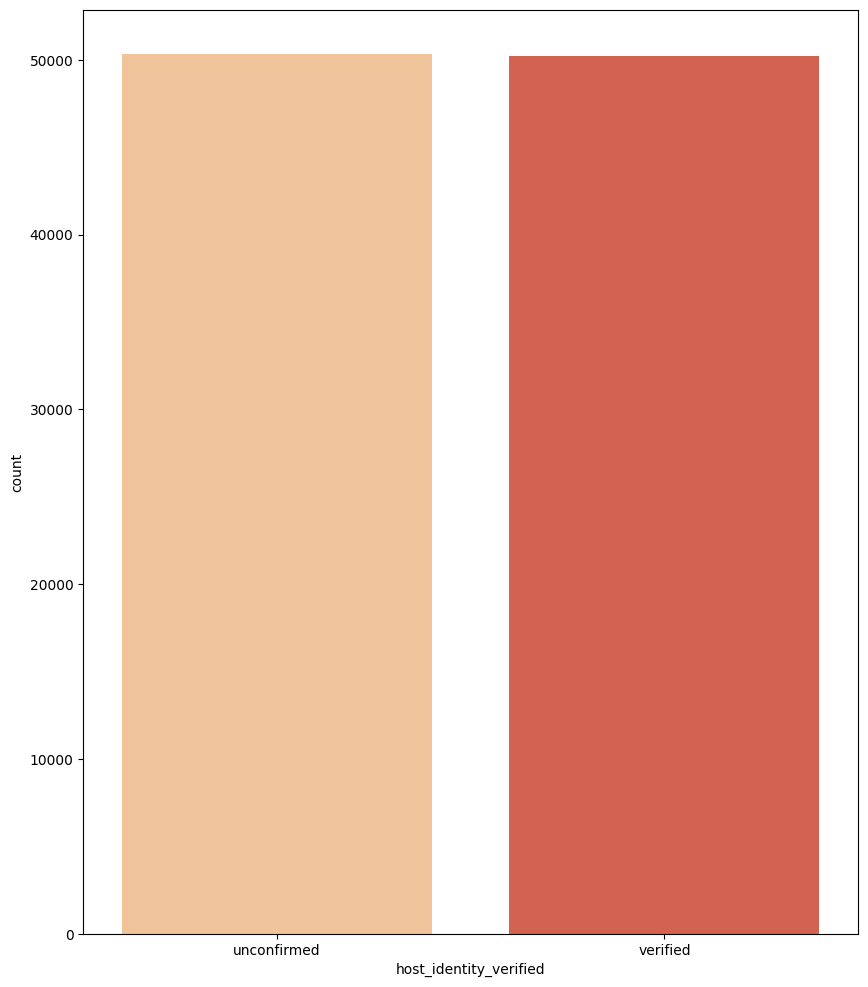

In [ ]:
plt.figure(figsize=(10, 12))
plt.xlabel("feature : {}".format(feature))
sns.countplot(data = hotelData, x = 'host_identity_verified', palette="OrRd")
plt.show()

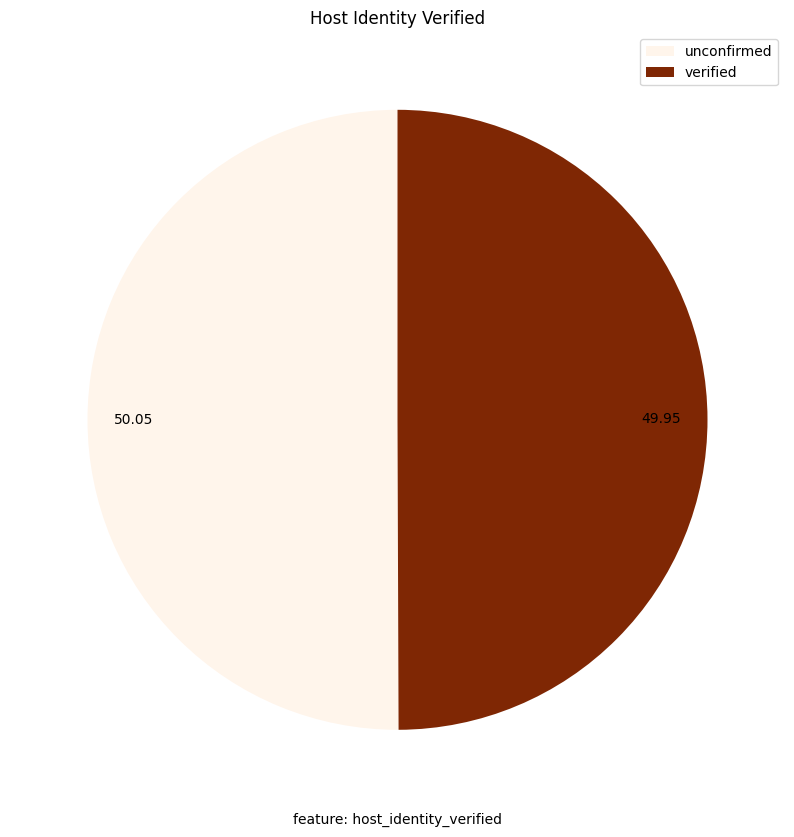

In [ ]:
plt.figure(figsize=(10, 12))
plt.xlabel("feature: {}".format(feature))
labels = hotelData['host_identity_verified'].value_counts().index
sizes = hotelData['host_identity_verified'].value_counts().values
colors = plt.cm.Oranges(np.linspace(0, 1, len(labels)))
plt.pie(sizes, autopct='%.2f', startangle=90, colors=colors, pctdistance=0.85)
plt.title("Host Identity Verified")
plt.legend(labels, loc="best")
plt.show()

Dari plot yang ditampilkan, jumlah verifikasi dan non-verifikasi tidak berbeda jauh, yang menyebabkan ketidakamanan bagi tamu, dan nantinya dapat memperbaikinya serta memastikan tingkat keamanan yang lebih tinggi bagi tamu dengan berupaya meningkatkan jumlah verifikasi

## Lat and Long

In [ ]:
# menghitung rata-rata latitude
lat_mean = hotelData['lat'].mean()

# menghitung rata-rata longitude
long_mean = hotelData['long'].mean()

# Menghitung rata-rata latitude berdasarkan grup neighbourhood_group
area_lat = hotelData['lat'].groupby(hotelData['neighbourhood_group']).mean()

# Menghitung rata-rata longitude berdasarkan grup neighbourhood_group
area_long = hotelData['long'].groupby(hotelData['neighbourhood_group']).mean()

# Menggabungkan 'area_lat' dan 'area_long' menjadi satu DataFrame
area_lat_long = pd.concat([area_lat, area_long], axis=1)

# Mengubah DataFrame 'area_lat_long' menjadi bentuk daftar (list)
area_lat_long = area_lat_long.values.tolist()

### Map 1

In [ ]:
# menciptakan peta dengan lokasi pusat yang ditentukan dan menambahkan penanda pada setiap koordinat
map = folium.Map(location=[lat_mean, long_mean], zoom_start=10)
for point in range(0, len(area_lat_long)):
  _=folium.Marker(area_lat_long[point], popup=area_lat_long[point]).add_to(map)
map

Semua berada di kota New York

### Map 2

In [ ]:
listings_per_neighbour_hood_group = hotelData.groupby('neighbourhood_group')['neighbourhood_group'].count()
listings_per_neighbour_hood_group

neighbourhood_group
Bronx             2658
Brooklyn         41017
Manhattan        42943
Queens           13043
Staten Island      933
Name: neighbourhood_group, dtype: int64

In [ ]:
neighbourhood_group_lat_long = hotelData.groupby('neighbourhood_group')[['lat', 'long']].mean()
neighbourhood_group_lat_long

,lat,long
neighbourhood_group,,
Bronx,40.849183,-73.883226
Brooklyn,40.683786,-73.950469
Manhattan,40.765282,-73.974415
Queens,40.728525,-73.867801
Staten Island,40.611729,-74.105234


In [ ]:
# plot peta dunia untuk jumlah daftar per neighbourhood group
fig = px.scatter_mapbox(neighbourhood_group_lat_long,
                        lat = neighbourhood_group_lat_long['lat'],
                        lon = neighbourhood_group_lat_long['long'],
                        hover_name = neighbourhood_group_lat_long.index,
                        hover_data = {'lat': False, 'long':False},
                        color_discrete_sequence = px.colors.sequential.Plasma,
                        size = listings_per_neighbour_hood_group.values,
                        size_max = 15,
                        zoom = 10,
                        title='Number of listings per neighbourhood group',
                        template='plotly_dark')

fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(font=dict(size=20, color='white', family='Avenir'))
fig.show()            

### Map 3

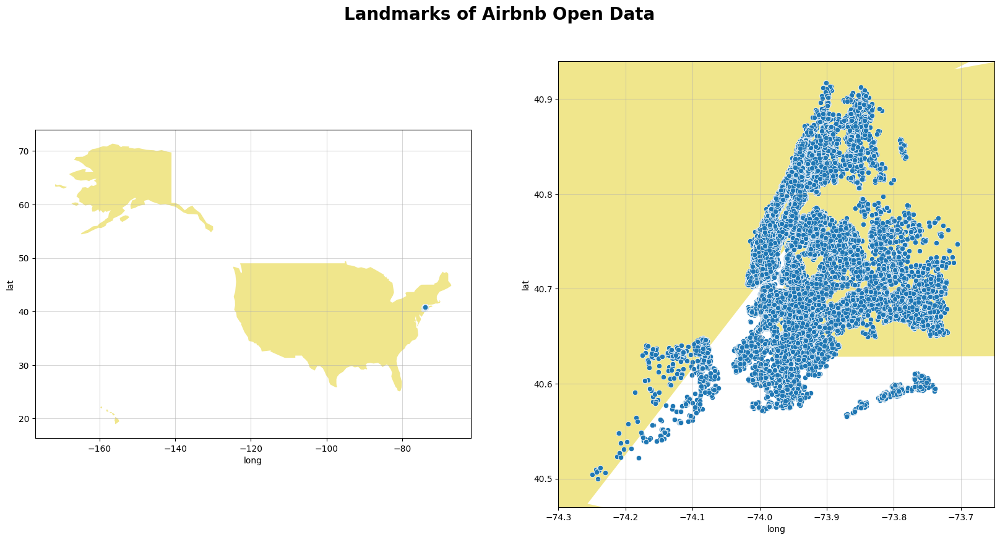

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 20))

url = 'https://raw.githubusercontent.com/nvkelso/natural-earth-vector/master/geojson/ne_110m_admin_0_countries.geojson'
countries = gpd.read_file(url)

countries[countries['ADMIN'] == 'United States of America'].plot(color='khaki', ax=ax[0])
countries[countries['ADMIN'] == 'United States of America'].plot(color='khaki', ax=ax[1])

sns.scatterplot(x='long', y='lat', data=hotelData, ax=ax[0])
sns.scatterplot(x='long', y='lat', data=hotelData, ax=ax[1])

ax[0].grid(visible=True, alpha=0.5)
ax[1].grid(visible=True, alpha=0.5)
ax[1].set_xlim([-74.3, -73.65])
ax[1].set_ylim([40.47, 40.94])

plt.suptitle("Landmarks of Airbnb Open Data", x=0.5, y=0.72, fontweight="bold", fontsize=20)
plt.show()


## Number of review

In [ ]:
hotelData['number of reviews'].describe()

count    100413.000000
mean         27.378766
std          49.374220
min           0.000000
25%           1.000000
50%           7.000000
75%          30.000000
max        1024.000000
Name: number of reviews, dtype: float64

In [ ]:
top10reviewed_neighbourhoods = hotelData.groupby(['neighbourhood'])['number of reviews'].sum().sort_values(ascending=False)[0:10]
print(top10reviewed_neighbourhoods)

neighbourhood
Bedford-Stuyvesant    267046.0
Williamsburg          185310.0
Harlem                174755.0
Bushwick              121850.0
Hell's Kitchen        108868.0
East Village           94920.0
Crown Heights          87774.0
East Harlem            80553.0
Upper West Side        76030.0
Upper East Side        68745.0
Name: number of reviews, dtype: float64


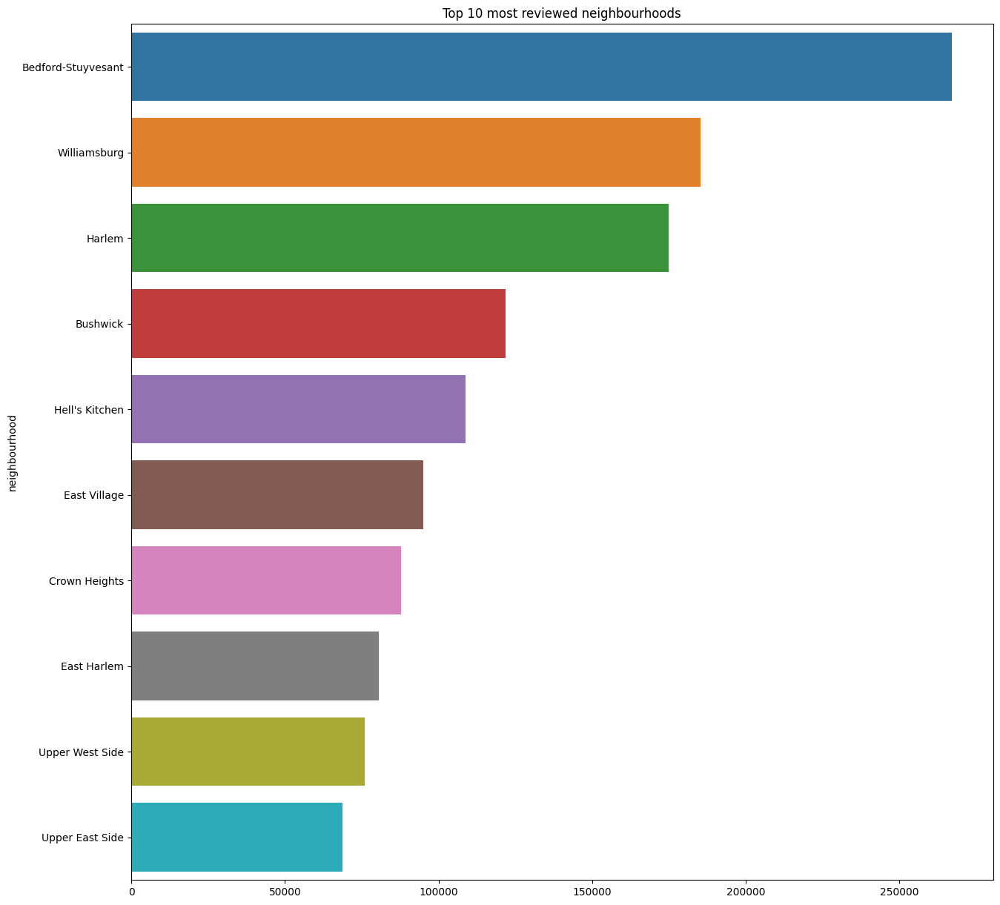

In [ ]:
plt.figure(figsize=(15,15))
plt.title('Top 10 most reviewed neighbourhoods')
sns.barplot(x = top10reviewed_neighbourhoods.values, y=top10reviewed_neighbourhoods.index)
plt.show()

## Availabilty 365

In [ ]:
hotelData['availability 365'].describe()

count    100205.000000
mean        140.260716
std         133.409921
min           0.000000
25%           4.000000
50%          96.000000
75%         268.000000
max         365.000000
Name: availability 365, dtype: float64

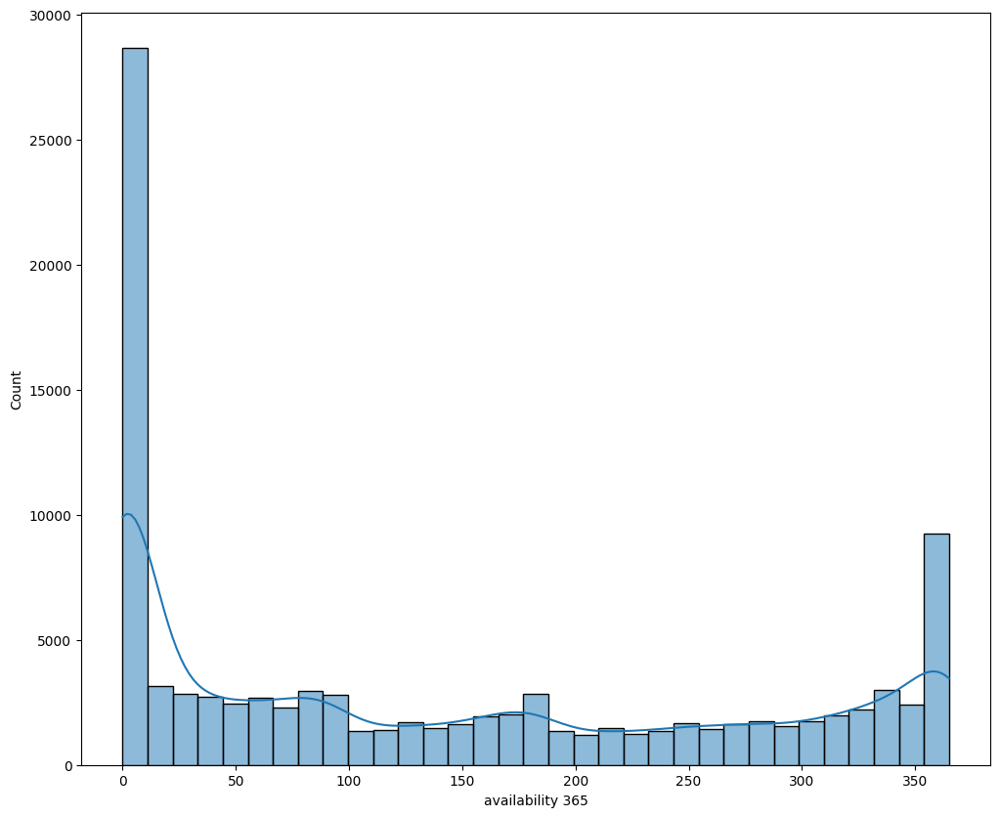

In [ ]:
plt.figure(figsize=(12,10))
sns.histplot(data=hotelData, x='availability 365', kde=True)
plt.show()

In [ ]:
hotelData['availability_grp'] = np.where(hotelData['availability 365']<=90, '0-3 Months',
                                         np.where((hotelData['availability 365'] > 9) & (hotelData['availability 365'] <= 180), '3-6 Months',
                                         np.where((hotelData['availability 365'] > 180) & (hotelData['availability 365'] <= 270), '6-9 Months', '9-12 Months')))

In [ ]:
hotelData['availability_grp'].value_counts()

0-3 Months     49186
9-12 Months    25041
3-6 Months     14666
6-9 Months     11701
Name: availability_grp, dtype: int64

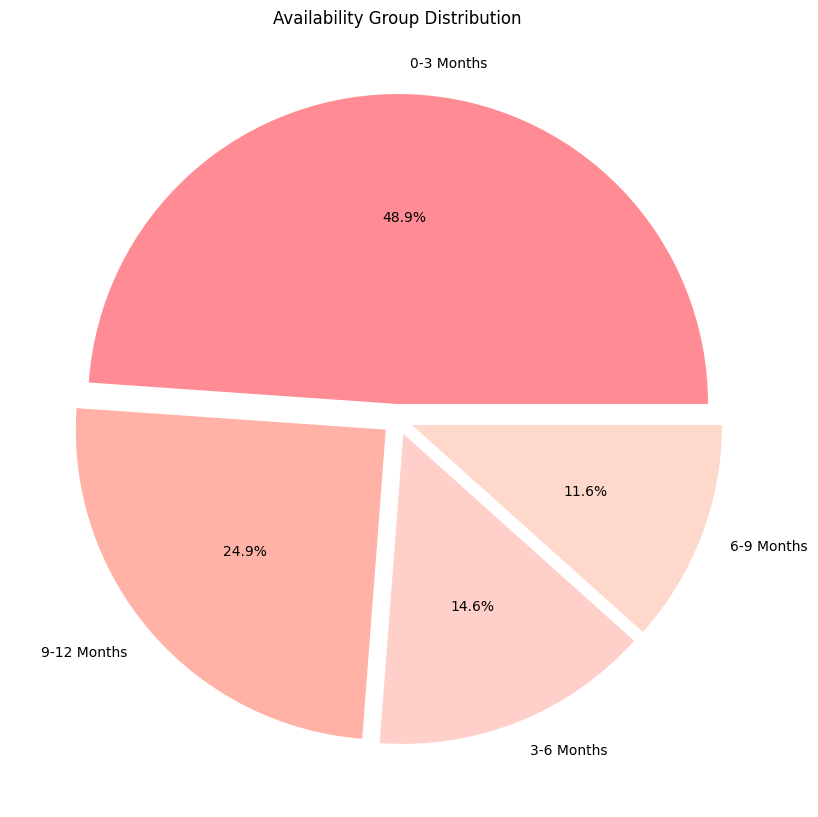

In [ ]:
hotelData['availability_grp'].value_counts().plot.pie(autopct='%1.1f%%', figsize=(10, 12), explode=(0.05, 0.05, 0.05, 0.05), colors=['#ff8c94', '#ffb2a5', '#ffcfc9', '#ffd8cc'])
plt.ylabel('')
plt.title('Availability Group Distribution')
plt.show()


In [ ]:
availability_per_neighbourhood_group = hotelData.groupby('neighbourhood_group')['availability 365'].mean()

fig = px.bar(
    availability_per_neighbourhood_group,
    x=availability_per_neighbourhood_group.index,
    y=availability_per_neighbourhood_group.values,
    labels={'x': 'Neighbourhood group', 'y': 'Average availability'},
    text=[str(round(i)) for i in availability_per_neighbourhood_group.values],
    title='Average availability per neighbourhood group',
    color_discrete_sequence=px.colors.sequential.OrRd,  # Menggunakan palet warna OrRd
    template='plotly_dark'
)

fig.update_layout(font=dict(size=20, color='white', family='Avenir'))

fig.show()


## Review Rate Number

In [ ]:
avg_rating_per_neighbourhood = hotelData.groupby(['neighbourhood'])['review rate number'].mean().sort_values(ascending=False)[0:5]
print(avg_rating_per_neighbourhood)

neighbourhood
Glen Oaks          4.500000
Co-op City         4.400000
Gerritsen Beach    4.333333
Huguenot           4.111111
Eltingville        4.000000
Name: review rate number, dtype: float64


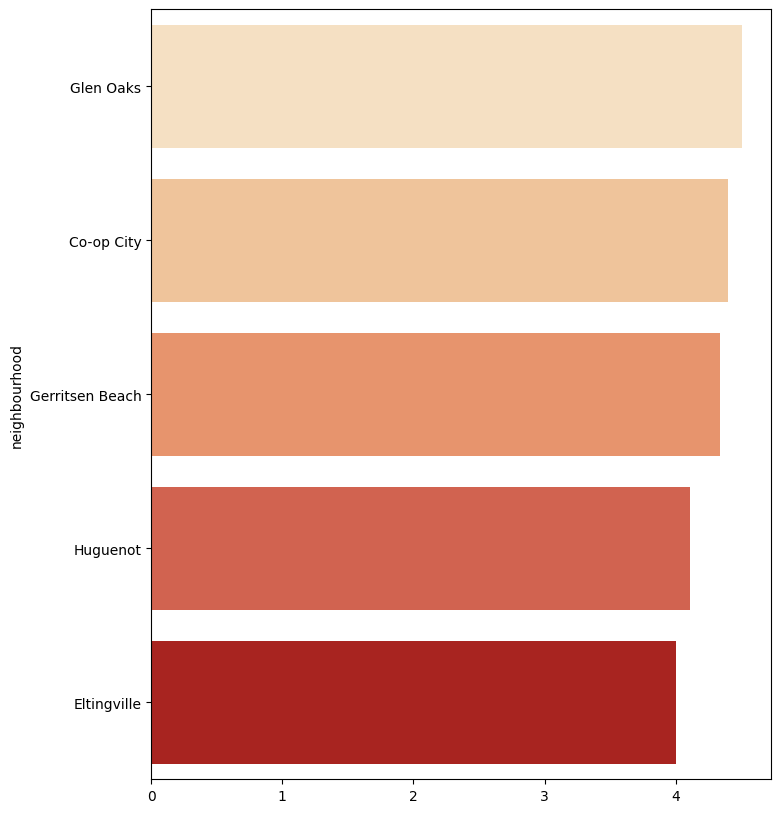

In [ ]:
plt.figure(figsize=(8,10))
sns.barplot(x=avg_rating_per_neighbourhood.values, y=avg_rating_per_neighbourhood.index, palette='OrRd')
plt.show()

## Price

In [ ]:
hotelData['price'].describe()

count    100594.000000
mean        625.371275
std         331.651913
min          50.000000
25%         340.000000
50%         625.000000
75%         913.000000
max        1200.000000
Name: price, dtype: float64

<Axes: xlabel='price', ylabel='Count'>

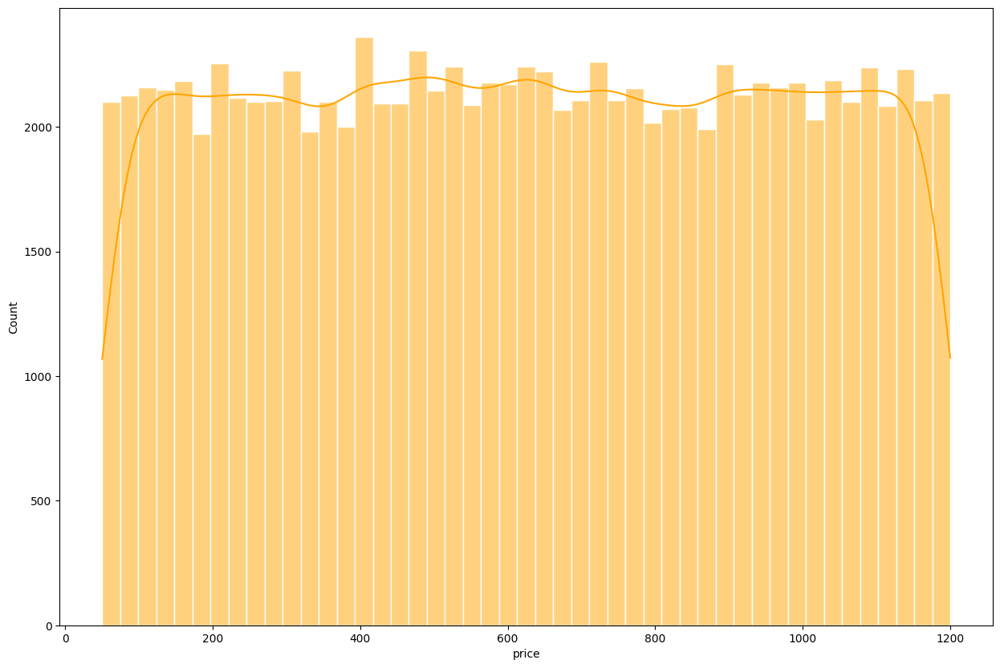

In [ ]:
fig, ax = plt.subplots(figsize=(15,10))
sns.set(font_scale=2)
sns.histplot(data=hotelData, x='price', kde=True, color='Orange')

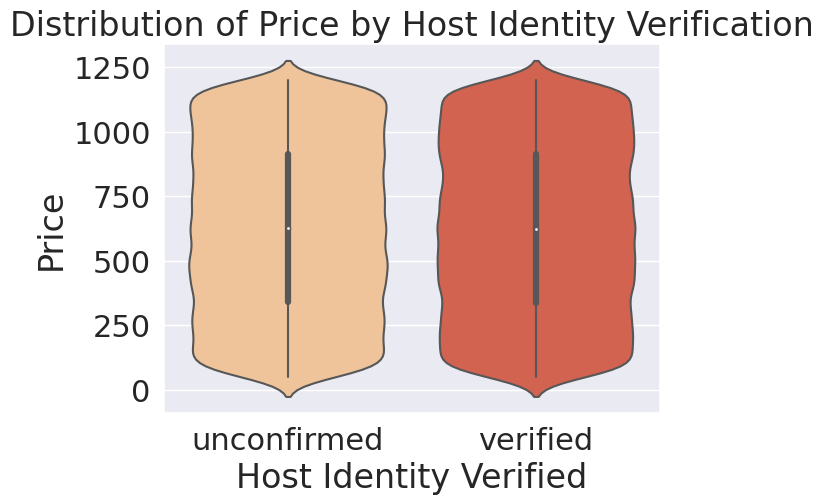

In [ ]:
ax = sns.violinplot(x='host_identity_verified', y='price', data=hotelData, palette='OrRd')

plt.xlabel('Host Identity Verified')
plt.ylabel('Price')
plt.title('Distribution of Price by Host Identity Verification')
plt.show()

Ternyata host identity tidak berpengaruh terhadap harga

<Axes: xlabel='neighbourhood_group', ylabel='price'>

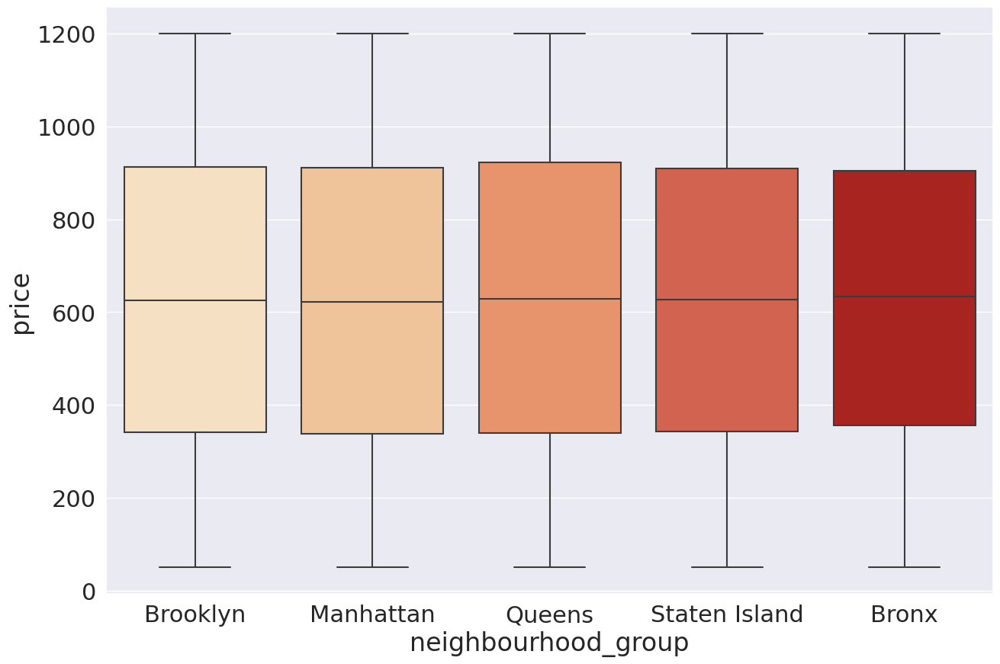

In [ ]:
fig, ax = plt.subplots(figsize=(15,10))
sns.set(font_scale=2)
sns.boxplot(x='neighbourhood_group', y='price', data=hotelData, palette='OrRd')

TidaK ada perbedaan besar antara neighbourhood group dan setelah dibandingkan harganya, sehingga kisaran harganya hampir sama

In [ ]:
price_per_room_type = hotelData.groupby('room type')['price'].median()
price_per_room_type

room type
Entire home/apt    625.0
Hotel room         643.0
Private room       623.0
Shared room        651.0
Name: price, dtype: float64

In [ ]:
fig = px.bar(price_per_room_type,
             x = price_per_room_type.index,
             y = price_per_room_type.values,
             labels={'x':'Room type', 'y':'Rata - Rata harga'},
             text=['$' + str(int(i)) for i in price_per_room_type.values],
             title='Rata - Rata harga per room type dalam USD',
             color_discrete_sequence = px.colors.sequential.OrRd,
             template = 'plotly_dark')

fig.update_layout(font=dict(size=16, color = 'white', family = 'Avenir'))
fig.show()

In [ ]:
price_per_year = hotelData.groupby('Construction year')['price'].median()
price_per_year

Construction year
2003.0    627.0
2004.0    635.0
2005.0    622.0
2006.0    637.5
2007.0    629.0
2008.0    636.0
2009.0    618.0
2010.0    626.0
2011.0    624.0
2012.0    623.0
2013.0    611.0
2014.0    631.0
2015.0    604.0
2016.0    625.5
2017.0    618.0
2018.0    622.0
2019.0    606.0
2020.0    610.5
2021.0    637.0
2022.0    636.0
Name: price, dtype: float64

In [ ]:
fig = px.line(price_per_year,
            x=price_per_year.index,
            y=price_per_year.values,
            labels={'x': 'Construction year', 'y': 'Average price'},
            text=['$' + str(int(i)) for i in price_per_year.values],
            title='Average price per construction year in USD',
            color_discrete_sequence=px.colors.sequential.Teal_r,
            template='plotly_dark'
)

fig.update_layout(font=dict(size=16, color='white', family='Avenir'))

fig.show()

Seperti yang bisa dilihat harga rata rata nya rentang antara 600 - 620 per malam

In [ ]:
fig = px.scatter_mapbox(
    hotelData,
    lat="lat",
    lon="long",
    opacity=0.3,
    hover_name="neighbourhood_group",
    hover_data=["neighbourhood_group", "price"],
    color="price",
    color_discrete_sequence=px.colors.sequential.OrRd,  # Menggunakan palet warna OrRd
    title="Price comparing to the place",
    template="plotly_dark",
    zoom=10
)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0}, font=dict(size=17, family="Franklin Gothic"))

fig.show()


## Room type

In [ ]:
hotelData['room type'].value_counts()

Entire home/apt    52691
Private room       45606
Shared room         2182
Hotel room           115
Name: room type, dtype: int64

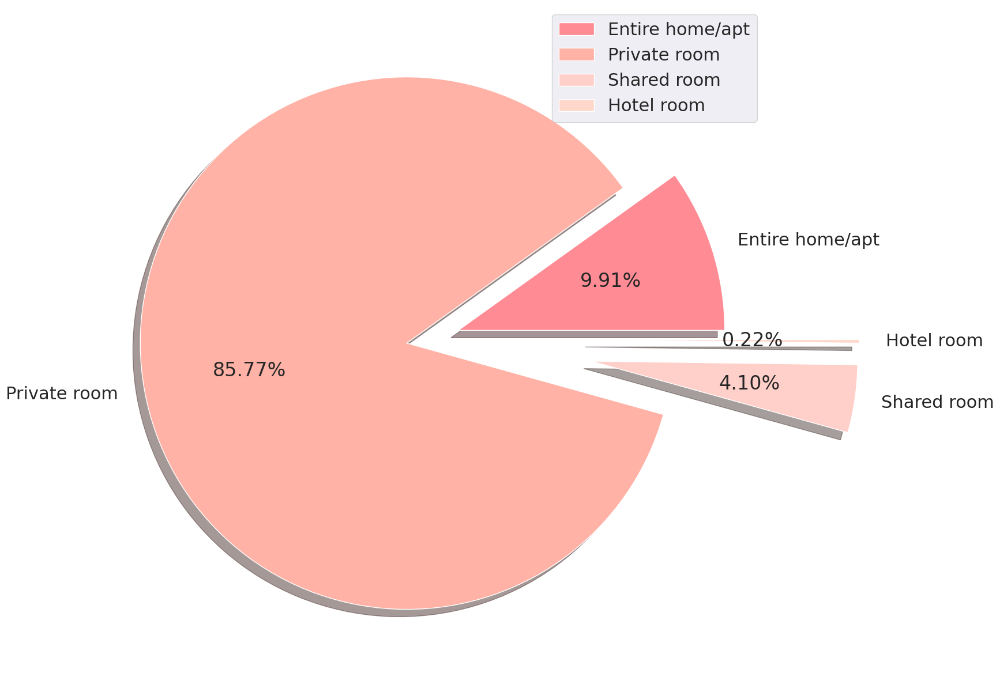

In [ ]:
plt.figure(figsize=(15, 15))
data = [5269, 45606, 2182, 115]
labels = ["Entire home/apt", "Private room", "Shared room", "Hotel room"]
explode = [0.1, 0.1, 0.6, 0.6]
colors = ['#ff8c94', '#ffb2a5', '#ffcfc9', '#ffd8cc']

plt.pie(data, labels=labels, explode=explode, autopct="%1.2f%%", shadow=True, colors=colors)
plt.legend()
plt.show()

### Map on room types

In [ ]:
fig = px.scatter_mapbox(hotelData,
           lat="lat",
           lon="long",
           opacity = 0.3,
           hover_name="neighbourhood_group",
           hover_data=["neighbourhood_group", "room type"],
           color="room type",
            color_discrete_sequence=px.colors.qualitative.Dark24,
           title = "Price comparing to the place",
           template = "plotly_dark",
           zoom=10
           )
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0},font = dict(size=17,family="Franklin Gothic"))
fig.show()

## Construction year

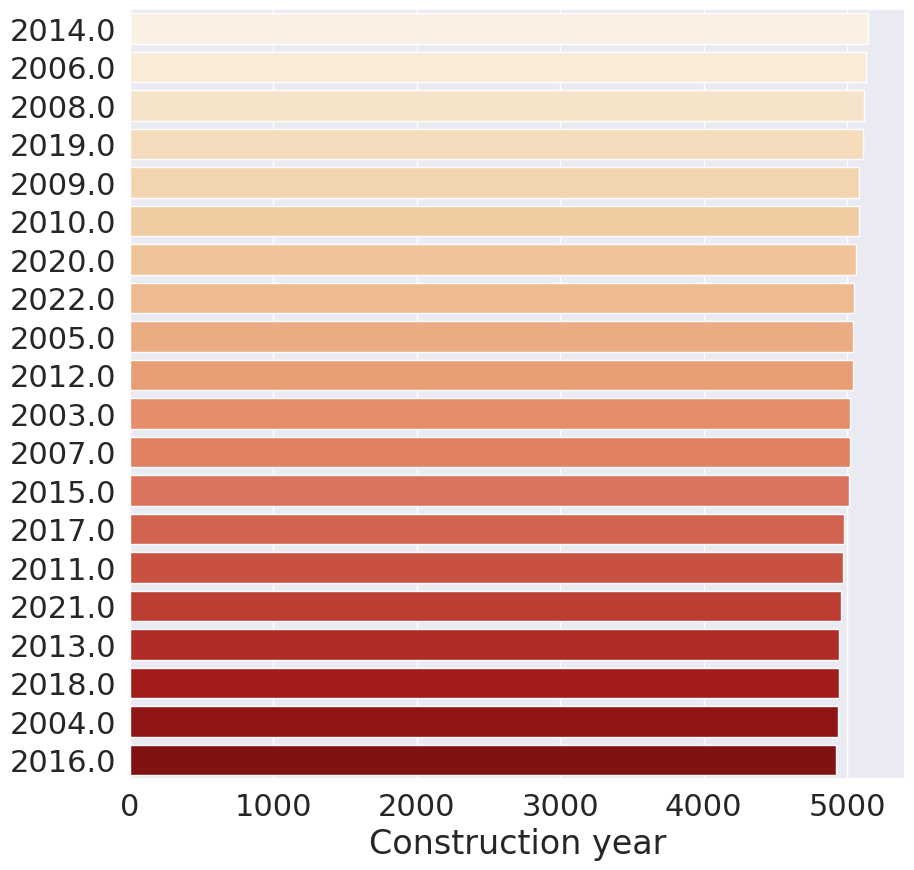

In [ ]:
plt.figure(figsize=(10, 10))
plt.xlabel("feature: {}".format(feature))

construction_year_counts = hotelData['Construction year'].value_counts().sort_values(ascending=False)
sns.barplot(y=construction_year_counts.index, 
            x=construction_year_counts, 
            order=construction_year_counts.index,
            palette="OrRd", 
            orient='h')

plt.show()

Jadi dapat dilihat jumlah construction year yang terbanyak adalah construction year 2016

In [ ]:
constructions_per_year = hotelData.groupby('Construction year')['Construction year'].count()
constructions_per_year

Construction year
2003.0    5024
2004.0    4940
2005.0    5041
2006.0    5130
2007.0    5024
2008.0    5122
2009.0    5082
2010.0    5081
2011.0    4975
2012.0    5040
2013.0    4945
2014.0    5146
2015.0    5015
2016.0    4922
2017.0    4980
2018.0    4943
2019.0    5110
2020.0    5064
2021.0    4961
2022.0    5049
Name: Construction year, dtype: int64

In [ ]:
fig = px.bar(constructions_per_year, 
            x=constructions_per_year.index, 
            y=constructions_per_year.values, 
            labels={'x': 'Construction year', 'y': 'Number of constructions'},
            text=[str(i) for i in constructions_per_year.values],
            color_discrete_sequence=px.colors.sequential.OrRd,
            title='Number of constructions per year',
            template='plotly_dark'
)

fig.update_layout(font=dict(size=20, color='white', family='Avenir'))

Dapat dilihat ada sekitar 5000 construction per year di kumpulan datanya

## Neighbourhood group

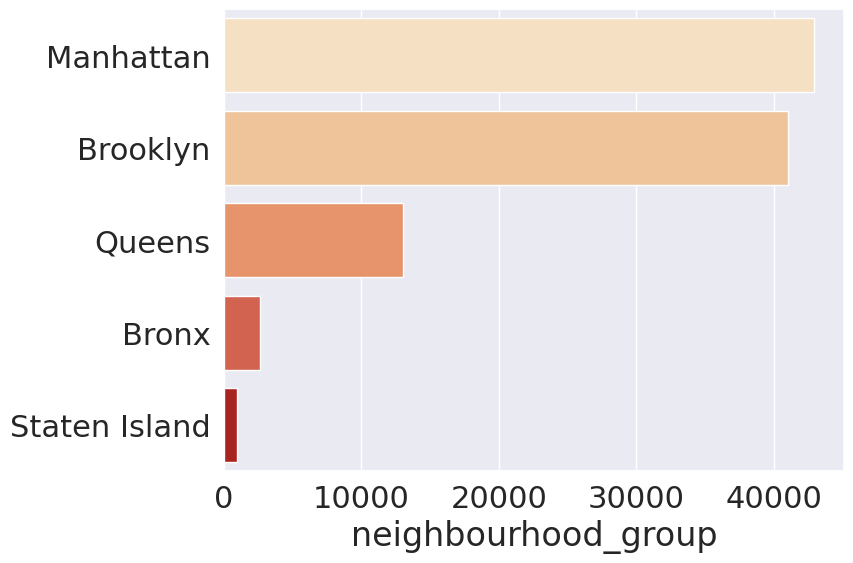

In [ ]:
plt.figure(figsize=(8,6))
plt.xlabel("feature: {}".format(feature))
sns.barplot(x=hotelData['neighbourhood_group'].value_counts(), 
            y=hotelData['neighbourhood_group'].value_counts().index, palette="OrRd")
plt.show()

In [ ]:
def readable_format(num: int) -> str:
    """
    Convert any number type into comma format values
   
    Example: 1000000 -> 1,000,000
    """
    num = float('{:.3g}'.format(num))
    i = 0

    while abs(num) >= 1000:
        i += 1
        num /= 1000.0

    return '{}{}'.format('{:f}'.format(num).rstrip('0').rstrip('.'), ['', 'K', 'M', 'B', 'T'][i])

In [ ]:
fig = px.bar(listings_per_neighbour_hood_group,
            x=listings_per_neighbour_hood_group.index,
            y=listings_per_neighbour_hood_group.values,
            labels={'x': 'neighbourhood_group', 'y': 'Number of listings'},
            text=[readable_format(i) for i in listings_per_neighbour_hood_group.values],
            title='Number of listings per neighbourhood group',
            color_discrete_sequence=px.colors.sequential.OrRd,
            template='plotly_dark'
)

fig.update_layout(font=dict(size=20, color='white', family='Avenir'))

fig.show()

In [ ]:
service_fee_per_neighbourhood_group = hotelData.groupby('neighbourhood_group')['service fee'].mean()
service_fee_per_neighbourhood_group

neighbourhood_group
Bronx            125.286682
Brooklyn         124.946339
Manhattan        124.296742
Queens           125.706279
Staten Island    124.308682
Name: service fee, dtype: float64

In [ ]:
fig = px.bar(service_fee_per_neighbourhood_group,
            x=service_fee_per_neighbourhood_group.index,
            y=service_fee_per_neighbourhood_group.values,
            labels={'x': 'Neighbourhood_group', 'y': 'Average service fee'},
            text=['$' + str(int(i)) for i in service_fee_per_neighbourhood_group.values],
            title='Average service fee per neighbourhood group in USD',
            color_discrete_sequence=px.colors.sequential.OrRd,
            template='plotly_dark'
)

fig.update_layout(font=dict(size=16, color='white', family='Avenir'))

fig.show()

In [ ]:
review_rate_per_neighbourhood_group = hotelData.groupby('neighbourhood_group')['review rate number'].mean()
review_rate_per_neighbourhood_group

neighbourhood_group
Bronx            3.333460
Brooklyn         3.257901
Manhattan        3.278338
Queens           3.328310
Staten Island    3.404301
Name: review rate number, dtype: float64

In [ ]:
fig = px.bar(review_rate_per_neighbourhood_group,
            x=review_rate_per_neighbourhood_group.index,
            y=review_rate_per_neighbourhood_group.values,
            labels={'x': 'Neighbourhood group', 'y': 'Average review rate'},
            text=[str(round(i, 2)) for i in review_rate_per_neighbourhood_group.values],
            title='Average review rate per neighbourhood group',
            color_discrete_sequence=px.colors.sequential.OrRd,
            template='plotly_dark'
)

fig.update_layout(font=dict(size=20, color='white', family='Avenir'))

fig.show()

## Host Name

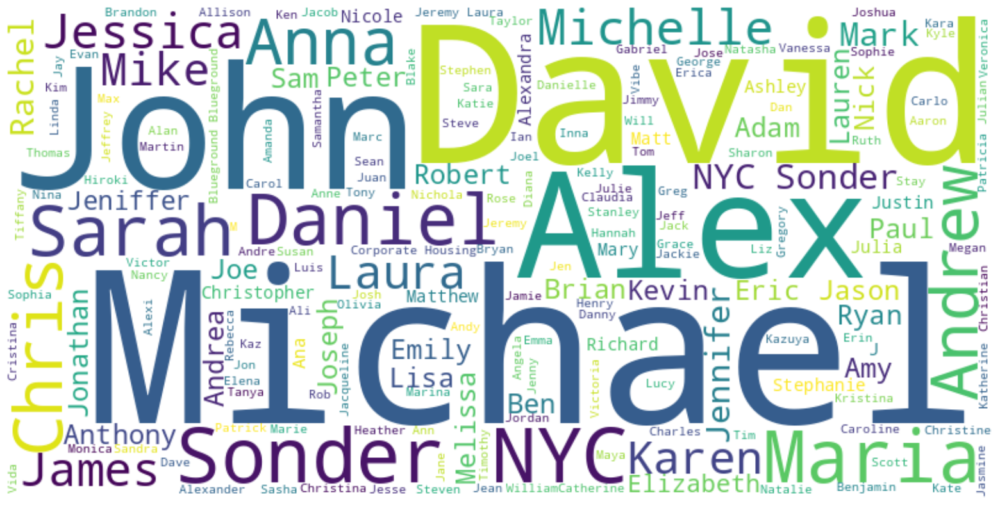

In [ ]:
host_names = hotelData['host name'].values
wordcloud = WordCloud(background_color='white', width=800, height=400).generate(' '.join(host_names))
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

Michael, John, David merupakan host names terbanyak

## Service Fee

In [ ]:
hotelData['service fee'].describe()

count    100594.000000
mean        124.770642
std          66.521027
min           0.000000
25%          68.000000
50%         125.000000
75%         182.000000
max         240.000000
Name: service fee, dtype: float64

<Axes: xlabel='service fee', ylabel='Count'>

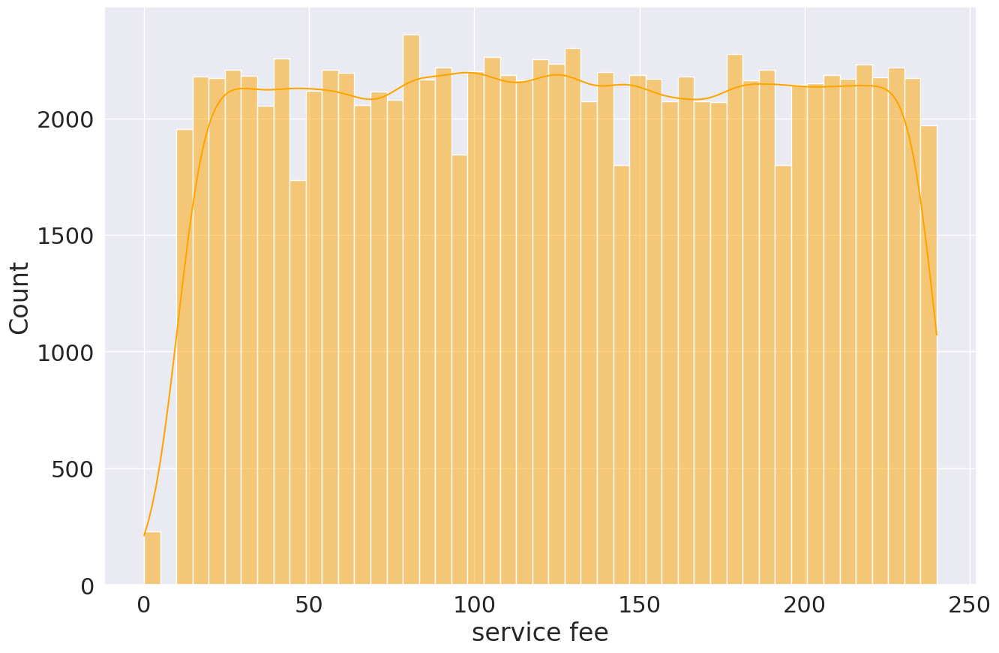

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.set(font_scale=2)
sns.histplot(data=hotelData, x="service fee", kde=True, color = "Orange")

## Neighbourhood 

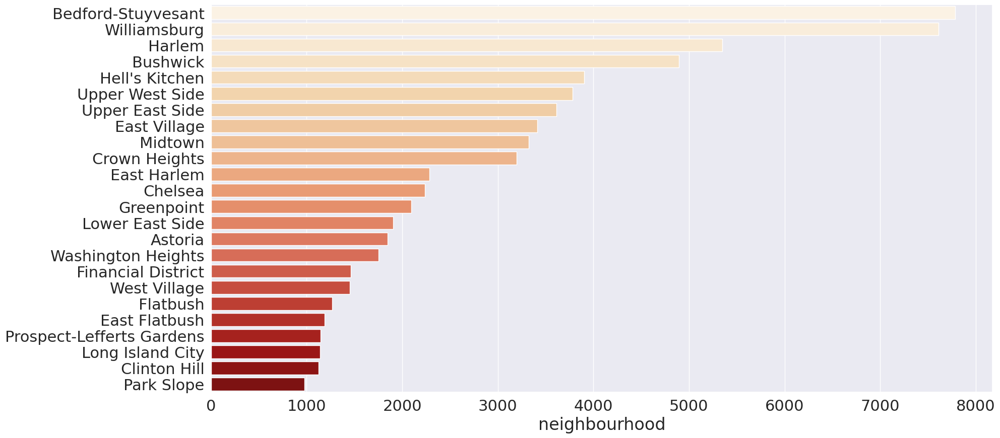

In [ ]:
plt.figure(figsize=(20,10))
plt.xlabel("feature: {}".format(feature))
sns.barplot(x=hotelData['neighbourhood'].value_counts()[0:24], 
            y=hotelData['neighbourhood'].value_counts().index[0:24], palette="OrRd")
plt.show()

# Encoding Data and Split Data

## Imputation

In [ ]:
hotelData["reviews per month"].fillna(hotelData["reviews per month"].mean(),inplace=True)
hotelData["minimum nights"].fillna(hotelData["minimum nights"].mean(),inplace=True)
hotelData["availability 365"].fillna(hotelData["availability 365"].mean(),inplace=True)
hotelData["calculated host listings count"].fillna(hotelData["calculated host listings count"].mean(),inplace=True)
hotelData["number of reviews"].fillna(hotelData["number of reviews"].median(), inplace=True)
hotelData["review rate number"].fillna(hotelData["review rate number"].median(), inplace=True)

In [ ]:
# fills null date 
num_days = 10
g = hotelData['last review'].notna().cumsum()
days = pd.to_timedelta(hotelData.groupby(g).cumcount().mul(num_days), unit='d')
hotelData['last review'] = hotelData['last review'].ffill().add(days)

In [ ]:
hotelData.isnull().sum().sort_values()

id                                0
calculated host listings count    0
review rate number                0
reviews per month                 0
last review                       0
number of reviews                 0
minimum nights                    0
service fee                       0
price                             0
Construction year                 0
availability 365                  0
room type                         0
instant_bookable                  0
long                              0
lat                               0
neighbourhood                     0
neighbourhood_group               0
host name                         0
host_identity_verified            0
host id                           0
NAME                              0
cancellation_policy               0
availability_grp                  0
dtype: int64

## Encode

### Host Identity Verified

In [ ]:
hotelData['host_identity_verified'].value_counts()

unconfirmed    50352
verified       50242
Name: host_identity_verified, dtype: int64

In [ ]:
le = LabelEncoder()
host_identity_verified_labelencoder = LabelEncoder()
hotelData['host_identity_verified'] = host_identity_verified_labelencoder.fit_transform(hotelData['host_identity_verified'])

In [ ]:
hotelData['host_identity_verified'].value_counts()

0    50352
1    50242
Name: host_identity_verified, dtype: int64

### Instant Bookable

In [ ]:
hotelData['instant_bookable'].value_counts()

False    50508
True     50086
Name: instant_bookable, dtype: int64

In [ ]:
le = LabelEncoder()
instant_bookable_labelencoder = LabelEncoder()
hotelData['instant_bookable'] = instant_bookable_labelencoder.fit_transform(hotelData['instant_bookable'])
hotelData['instant_bookable'].value_counts()

0    50508
1    50086
Name: instant_bookable, dtype: int64

### Cancelation Policy

In [ ]:
hotelData['cancellation_policy'].value_counts()

moderate    33708
strict      33478
flexible    33408
Name: cancellation_policy, dtype: int64

In [ ]:
le = LabelEncoder()
cancelation_policy_labelencoder = LabelEncoder()
hotelData['cancellation_policy'] = cancelation_policy_labelencoder.fit_transform(hotelData['cancellation_policy'])
hotelData['cancellation_policy'].value_counts()

1    33708
2    33478
0    33408
Name: cancellation_policy, dtype: int64

### Room Type

In [ ]:
hotelData['room type'].value_counts()

Entire home/apt    52691
Private room       45606
Shared room         2182
Hotel room           115
Name: room type, dtype: int64

In [ ]:
le = LabelEncoder()
room_type_labelencoder = LabelEncoder()
hotelData['room type'] = room_type_labelencoder.fit_transform(hotelData['room type'])
hotelData['room type'].value_counts()

0    52691
2    45606
3     2182
1      115
Name: room type, dtype: int64

### Neighbour Hood Group

In [99]:
hotelData['neighbourhood_group'].value_counts()

Manhattan        42943
Brooklyn         41017
Queens           13043
Bronx             2658
Staten Island      933
Name: neighbourhood_group, dtype: int64

In [100]:
le = LabelEncoder()
neighbourhood_group_labelencoder = LabelEncoder()
hotelData['neighbourhood_group'] = neighbourhood_group_labelencoder.fit_transform(hotelData['neighbourhood_group'])
hotelData['neighbourhood_group'].value_counts()

2    42943
1    41017
3    13043
0     2658
4      933
Name: neighbourhood_group, dtype: int64

In [102]:
hotelData.shape

(100594, 23)

## Data Splitting

In [103]:
data_split = hotelData.copy()
data_split

,id,NAME,host id,host_identity_verified,host name,neighbourhood_group,neighbourhood,lat,long,instant_bookable,...,price,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,availability_grp
0,1001254,Clean & quiet apt home by the park,80014485718,0,Madaline,1,Kensington,40.64749,-73.97237,0,...,966.0,193.0,10.0,9.0,2021-10-19,0.210000,4.0,6.0,286.0,9-12 Months
1,1002102,Skylit Midtown Castle,52335172823,1,Jenna,2,Midtown,40.75362,-73.98377,0,...,142.0,28.0,30.0,45.0,2022-05-21,0.380000,4.0,2.0,228.0,6-9 Months
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,1,Lyndon,2,East Harlem,40.79851,-73.94399,0,...,204.0,41.0,10.0,9.0,2018-11-19,0.100000,3.0,1.0,289.0,9-12 Months
5,1004098,Large Cozy 1 BR Apartment In Midtown East,45498551794,1,Michelle,2,Murray Hill,40.74767,-73.97500,1,...,577.0,115.0,3.0,74.0,2019-06-22,0.590000,3.0,1.0,365.0,9-12 Months
7,1005202,BlissArtsSpace!,90821839709,0,Emma,1,Bedford-Stuyvesant,40.68688,-73.95596,0,...,1060.0,212.0,45.0,49.0,2017-10-05,0.400000,5.0,1.0,219.0,6-9 Months
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102037,57356371,Bx Apartment,11038605149,0,Vii,0,Olinville,40.88438,-73.86397,1,...,531.0,0.0,1.0,0.0,2017-10-31,1.378291,3.0,1.0,0.0,0-3 Months
102038,57356923,HUGE BEDROOM LORIMER L TRAIN!!!,29320426760,0,Jose,1,Williamsburg,40.71355,-73.95003,1,...,570.0,0.0,28.0,17.0,2019-04-30,0.610000,1.0,6.0,229.0,6-9 Months
102039,57357476,Spacious two bedrooms condo in upper Manhattan,14430571516,1,Max,2,Inwood,40.86461,-73.92363,1,...,665.0,0.0,2.0,49.0,2019-05-23,1.810000,1.0,3.0,147.0,3-6 Months
102040,57358028,"Room in Queens, NY, near LGA.",56457739998,1,Sonia,3,East Elmhurst,40.76245,-73.87938,1,...,982.0,196.0,1.0,239.0,2019-06-29,8.580000,2.0,2.0,361.0,9-12 Months


In [104]:
data_split = data_split[['host_identity_verified',
                         'neighbourhood_group',
                         'instant_bookable',
                         'cancellation_policy',
                         'room type',
                         'Construction year',
                         'minimum nights',
                         'number of reviews',
                         'reviews per month',
                         'review rate number',
                         'calculated host listings count',
                         'availability 365',
                         'price', 
                         'service fee']]
data_split

,host_identity_verified,neighbourhood_group,instant_bookable,cancellation_policy,room type,Construction year,minimum nights,number of reviews,reviews per month,review rate number,calculated host listings count,availability 365,price,service fee
0,0,1,0,2,2,2020.0,10.0,9.0,0.210000,4.0,6.0,286.0,966.0,193.0
1,1,2,0,1,0,2007.0,30.0,45.0,0.380000,4.0,2.0,228.0,142.0,28.0
4,1,2,0,1,0,2009.0,10.0,9.0,0.100000,3.0,1.0,289.0,204.0,41.0
5,1,2,1,0,0,2013.0,3.0,74.0,0.590000,3.0,1.0,365.0,577.0,115.0
7,0,1,0,1,2,2009.0,45.0,49.0,0.400000,5.0,1.0,219.0,1060.0,212.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102037,0,0,1,2,2,2008.0,1.0,0.0,1.378291,3.0,1.0,0.0,531.0,0.0
102038,0,1,1,0,2,2016.0,28.0,17.0,0.610000,1.0,6.0,229.0,570.0,0.0
102039,1,2,1,1,0,2003.0,2.0,49.0,1.810000,1.0,3.0,147.0,665.0,0.0
102040,1,3,1,2,2,2022.0,1.0,239.0,8.580000,2.0,2.0,361.0,982.0,196.0


In [105]:
x= data_split.drop(['price'],axis=1).values
y= data_split['price'].values

In [107]:
x_train, x_test, Y_train, Y_test = train_test_split(x, y, test_size=0.25, random_state=42)

In [109]:
robust_scaler = RobustScaler()
x_train = robust_scaler.fit_transform(x_train)
x_test = robust_scaler.fit_transform(x_test)

In [110]:
x_train

array([[ 1.        ,  1.        ,  1.        , ...,  1.        ,
         0.22348485,  0.35652174],
       [ 1.        , -1.        ,  1.        , ...,  0.        ,
         0.67424242, -0.97391304],
       [ 1.        ,  0.        ,  1.        , ...,  0.        ,
         0.50378788, -0.51304348],
       ...,
       [ 0.        ,  0.        ,  1.        , ...,  0.        ,
        -0.37121212, -0.97391304],
       [ 1.        , -1.        ,  1.        , ...,  0.        ,
         0.30681818, -0.66086957],
       [ 0.        ,  1.        ,  1.        , ...,  0.        ,
         0.5       ,  0.25217391]])

In [111]:
x_test

array([[ 1.        ,  0.        , -1.        , ...,  0.        ,
        -0.22900763,  0.39130435],
       [ 0.        ,  1.        ,  0.        , ...,  0.        ,
        -0.23664122,  0.70434783],
       [ 0.        , -1.        , -1.        , ...,  2.        ,
         0.9351145 ,  0.8       ],
       ...,
       [ 0.        ,  0.        , -1.        , ...,  0.        ,
         0.11832061, -0.28695652],
       [ 0.        , -1.        , -1.        , ...,  1.        ,
        -0.16793893,  0.0173913 ],
       [ 1.        ,  0.        , -1.        , ...,  0.        ,
         0.02671756, -0.65217391]])

# Modelling

In [112]:
def plot_predictions(model, x_test, Y_test):
  y_pred = model.predict(x_test)
  df = pd.DataFrame({'Y Test' : Y_test, 'Y Pred' : y_pred})
  plt.figure(figsize=(20,10))
  plt.plot(df[:30])
  plt.legend(['Actual', 'Predicted'])

## Linear Regression

In [114]:
regression = linear_model.LinearRegression()
regression.fit(x_train, Y_train)
regressionv = regression.score(x_train, Y_train)
regressionv

0.9886161767574628

In [115]:
regression.score(x_test, Y_test)

0.987779775989641

In [116]:
regression.intercept_

626.3275298658182

In [117]:
pd.DataFrame(regression.coef_ , data_split.columns[:-1] , columns=['Coeficient'])

,Coeficient
host_identity_verified,-0.113908
neighbourhood_group,0.128890
instant_bookable,0.101816
cancellation_policy,-0.021242
room type,0.261975
Construction year,0.081602
minimum nights,0.066304
number of reviews,0.024625
reviews per month,-0.199102
review rate number,-0.010156


In [118]:
y_pred = regression.predict(x_test)
df = pd.DataFrame({"Y_test": Y_test , "Y_pred" : y_pred})
df.head(15)

,Y_test,Y_pred
0,845.0,849.346198
1,1026.0,1028.244220
2,1081.0,1082.524671
3,870.0,874.015647
4,130.0,139.774688
5,521.0,526.790488
6,1190.0,1191.393146
7,56.0,65.709469
8,646.0,651.356443
9,1016.0,1018.142303


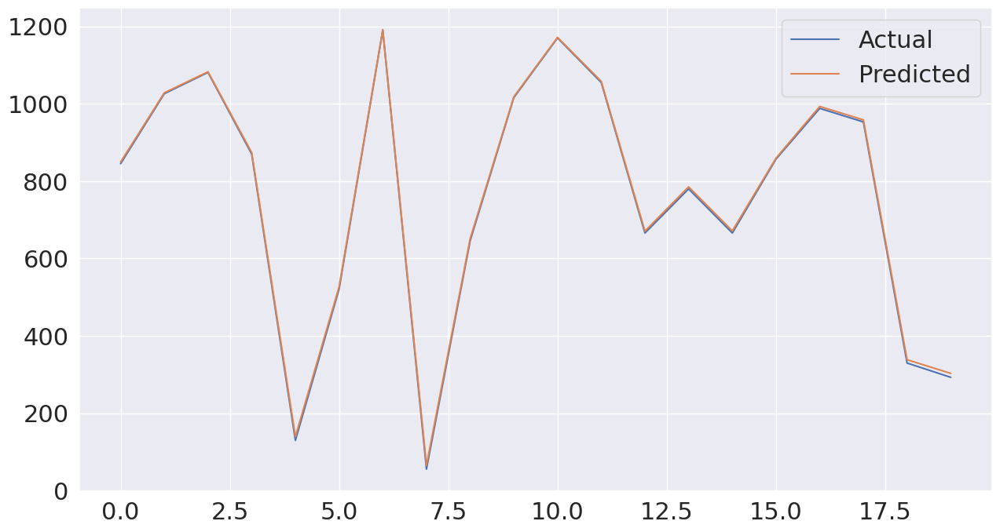

In [130]:
plt.figure(figsize=(15,8))
plt.plot(df[:20])
plt.legend(['Actual' , 'Predicted'])

### Evaluation LR

In [122]:
reg_score = r2_score(Y_test , y_pred)
reg_score

0.987779775989641

In [123]:
p = len(x_train[0])
n = len(Y_train)
adj_R2l = 1-(1-reg_score)*(n-1)/(n-p-1)
adj_R2l

0.9877776699203573

In [124]:
adj_R2l < reg_score

True

Ini menunjukkan bahwa model regresi linear Anda memiliki banyak variabel prediktor atau kompleksitas model yang relatif tinggi. Dalam hal ini, reg_score mungkin lebih tinggi karena model mampu menjelaskan variasi dalam data pelatihan dengan penambahan variabel prediktor yang lebih banyak. Jika peningkatan dalam kompleksitas model (lebih banyak variabel prediktor) tidak diimbangi dengan peningkatan yang substansial dalam penjelasan variasi target (yang tercermin dalam adj_R2 yang lebih rendah), maka penambahan variabel prediktor tersebut mungkin tidak memberikan manfaat yang signifikan

In [125]:
mse = mean_squared_error(Y_test , y_pred)
mse

1343.7712359329207

In [126]:
mae = mean_absolute_error(Y_test , y_pred)
mae

7.964311862942801

In [127]:
mpae= mean_absolute_percentage_error(Y_test,y_pred)
mpae

0.026264845104604286

In [128]:
reg_mse = mean_squared_error(Y_test,y_pred)
reg_rmse= np.sqrt(reg_mse)
reg_rmse

36.65748540111447

## Decision Tree Regressor

In [131]:
decisiontree_regressor = DecisionTreeRegressor().fit(x_train, Y_train)
decisiontree_regressorv = decisiontree_regressor.score(x_train,Y_train)
decisiontree_regressorv 

1.0

In [134]:
decisiontree_regressor.score(x_test, Y_test)

0.9948138226278191

In [135]:
y_pred = decisiontree_regressor.predict(x_test)

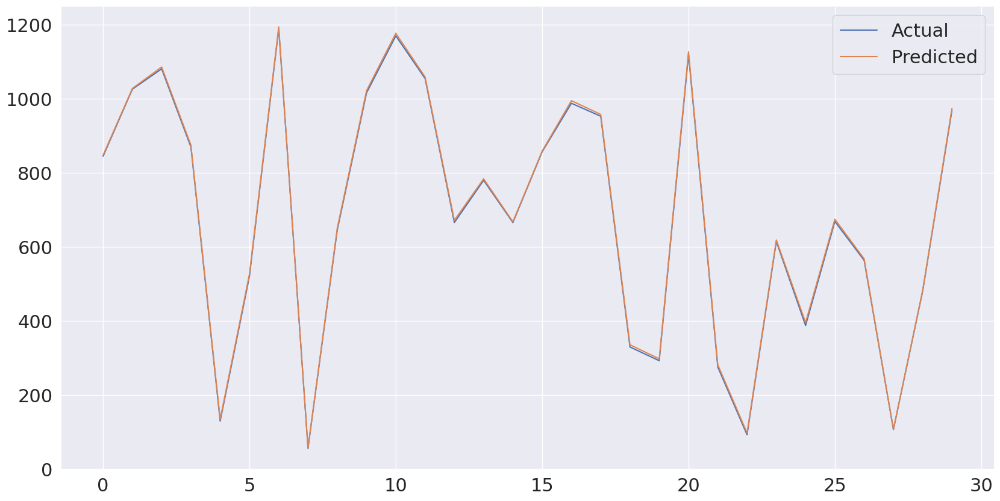

In [137]:
plot_predictions(decisiontree_regressor, x_test, Y_test)

### Evaluation DTR

In [138]:
decisiontree_regressor_score = r2_score(Y_test , y_pred)
decisiontree_regressor_score

0.9948138226278191

In [139]:
p = len(x_train[0])
n = len(Y_train)
adj_R2t = 1-(1-decisiontree_regressor_score)*(n-1)/(n-p-1)
adj_R2t

0.9948129288267846

In [141]:
adj_R2t < decisiontree_regressor_score

True

In [142]:
mse = mean_squared_error(Y_test , y_pred)
mse

570.2870889498588

In [143]:
mae = mean_absolute_error(Y_test,y_pred)
mae

5.93089188436916

In [144]:
mpae= mean_absolute_percentage_error(Y_test,y_pred)
mpae

0.016503428941855233

In [145]:
reg_mse = mean_squared_error(Y_test,y_pred)
reg_rmse= np.sqrt(reg_mse)
reg_rmse

23.880684432190357

## Random Forest Regressor

In [146]:
randomforest_regressor = RandomForestRegressor().fit(x_train, Y_train)
randomforest_regressorv = randomforest_regressor.score(x_train,Y_train)
randomforest_regressorv

0.9996440246918556

In [147]:
randomforest_regressor.score(x_test, Y_test)

0.9971444076809565

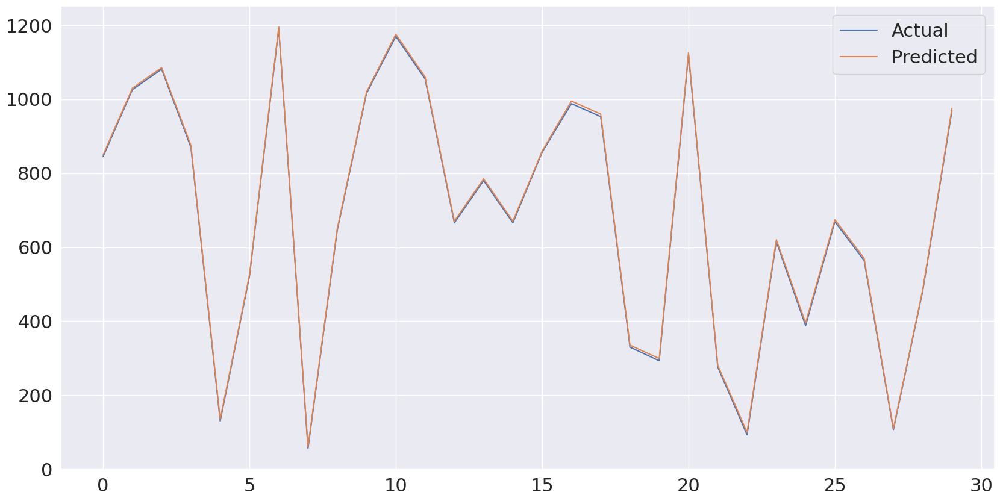

In [149]:
plot_predictions(randomforest_regressor, x_test, Y_test)

### Evaluation RFR

In [150]:
rf_score = r2_score(Y_test , y_pred)
rf_score

0.9948138226278191

In [152]:
p = len(x_train[0])
n = len(Y_train)
adj_R2r = 1-(1-rf_score)*(n-1)/(n-p-1)
adj_R2r

0.9948129288267846

In [153]:
adj_R2r < rf_score

True

## Ridge Regression

In [156]:
ridgeregression = linear_model.Ridge(alpha=0.4)
ridgeregression.fit(x_train , Y_train)
ridgeregressionv = ridgeregression.score(x_train , Y_train)
ridgeregressionv

0.9886161765091411

In [158]:
print(ridgeregression.score(x_train , Y_train))
print(ridgeregression.score(x_test , Y_test))

0.9886161765091411
0.9877798028370289


In [159]:
print(ridgeregression.intercept_)
print(ridgeregression.coef_)

626.3275608733879
[-1.13953588e-01  1.28901328e-01  1.01816251e-01 -2.12407670e-02
  2.61958784e-01  8.15902785e-02  6.63016083e-02  2.46384731e-02
 -1.99102334e-01 -1.01845235e-02  2.66903546e-04 -9.86538573e-02
  5.70137737e+02]


In [160]:
pd.DataFrame(ridgeregression.coef_ , data_split.columns[:-1] , columns=['Coeficient'])
y_pred = ridgeregression.predict(x_test)
df = pd.DataFrame({"Y_test": Y_test , "Y_pred" : y_pred})
df.head(15)

,Y_test,Y_pred
0,845.0,849.342673
1,1026.0,1028.237887
2,1081.0,1082.517377
3,870.0,874.011817
4,130.0,139.782414
5,521.0,526.792108
6,1190.0,1191.384130
7,56.0,65.718293
8,646.0,651.356023
9,1016.0,1018.136095


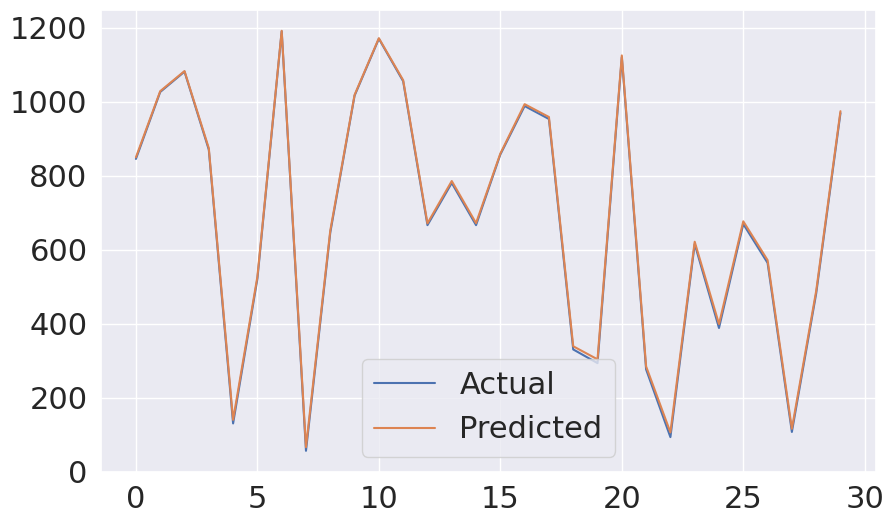

In [162]:
plt.figure(figsize=(10,6))
plt.plot(df[:30])
plt.legend(['Actual' , 'Predicted'])

### Evaluation RR

In [163]:
rid_score = r2_score(Y_test , y_pred)
rid_score

0.9877798028370289

In [164]:
p = len(x_train[0])
n = len(Y_train)
adj_R2rr = 1-(1-rid_score)*(n-1)/(n-p-1)
adj_R2rr

0.9877776967723723

In [165]:
adj_R2rr < rid_score

True

In [166]:
mse = mean_squared_error(Y_test , y_pred)
mse

1343.7682837163593

In [167]:
mae = mean_absolute_error(Y_test,y_pred)
mae

7.964424318388694

In [168]:
mpae= mean_absolute_percentage_error(Y_test,y_pred)
mpae

0.026276284019393508

In [169]:
reg_mse = mean_squared_error(Y_test,y_pred)
reg_rmse= np.sqrt(reg_mse)
reg_rmse

36.65744513351086

# Comparing Result Model

In [170]:
dic = {'linear Regression':regressionv,'Decision Tree':decisiontree_regressorv,'RandomForest Regressor':randomforest_regressorv,'Ridge Regression':ridgeregressionv}

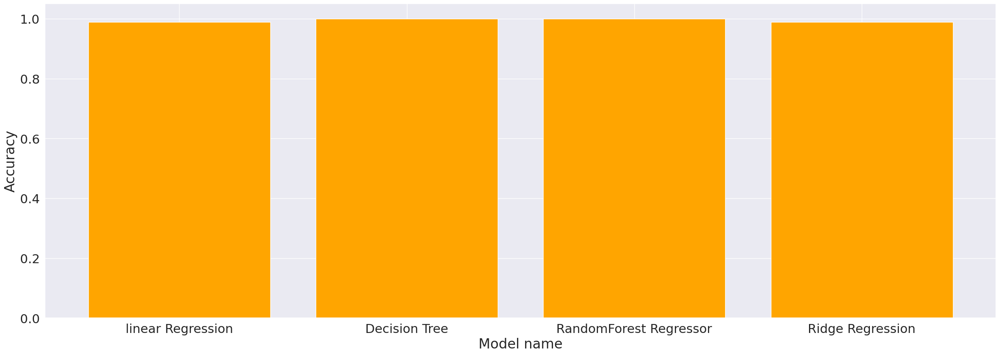

In [171]:
names = list(dic.keys())
values = list(dic.values())
plt.rc('font', size=20)

plt.figure(figsize=(30,10))
plt.xlabel('Model name')
plt.ylabel('Accuracy')

plt.bar(range(len(dic)), values, tick_label=names,color='Orange')
plt.show()

## R^2

In [172]:
dic2 = {'linear Regression':adj_R2l,'Decision Tree':adj_R2t,'RandomForest Regressor':adj_R2r,'Ridge Regression':adj_R2rr}

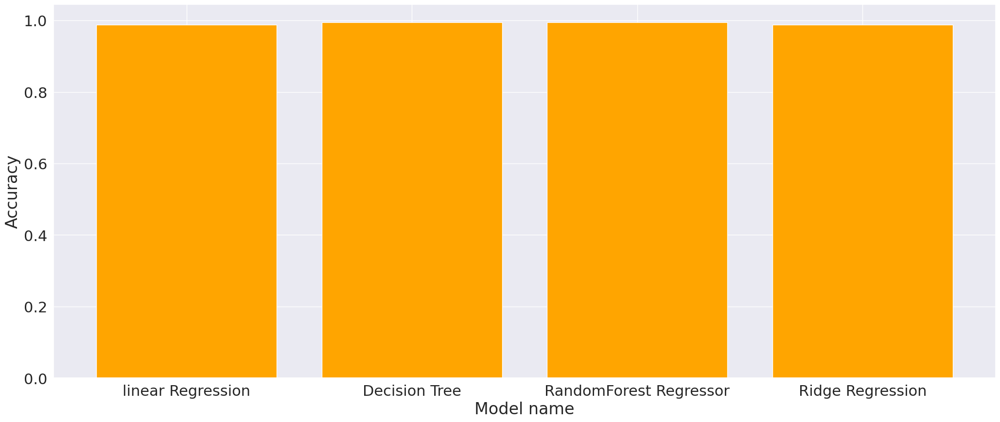

In [173]:
names = list(dic2.keys())
values = list(dic2.values())
plt.rc('font', size=20)

plt.figure(figsize=(25,10))
plt.xlabel('Model name')
plt.ylabel('Accuracy')

plt.bar(range(len(dic)), values, tick_label=names,color='Orange')
plt.show()